In [104]:
import datetime
from functools import partial

from typing import List, Callable
from sklearn.preprocessing import MinMaxScaler
import pandas as pd
from itertools import product
from collections import Counter
import vectorbt as vbt
from scipy.optimize import minimize
import numpy as np

In [105]:
class Labeler:
    def __init__(self, name):
        """
        Initialize the labeler.

        Args:
        name (str): The name of the labeler.
        """
        self.name = name

    def fit(self, data):
        """
        Fit the labeler to the data.

        This method should be overridden by subclasses to implement
        the actual fitting logic.

        Args:
        data (any): The data to fit the labeler to.
        """
        raise NotImplementedError("Subclasses must implement this method.")

    def transform(self, data):
        """
        Transform the data into labels.

        This method should be overridden by subclasses to implement
        the actual transformation logic.

        Args:
        data (any): The data to transform into labels.

        Returns:
        any: The labels.
        """
        raise NotImplementedError("Subclasses must implement this method.")

class TripleBarrierLabeler(Labeler):
    def __init__(self, volatility_period=7, upper_barrier_factor=1, lower_barrier_factor=1, vertical_barrier=7, min_trend_days=2, barrier_type='volatility', touch_type="HL", up_label=2, neutral_label=1, down_label=0):
        """
        Initialize the labeler.
        """
        super().__init__(name="triple barrier labeling")
        self.volatility_period = volatility_period
        self.upper_barrier_factor = upper_barrier_factor
        self.lower_barrier_factor = lower_barrier_factor
        self.vertical_barrier = vertical_barrier
        self.min_trend_days = min_trend_days
        self.barrier_type = barrier_type
        self.touch_type = touch_type
        self.up_label = up_label
        self.down_label = down_label
        self.neutral_label = neutral_label

    def calculate_barriers(self, df, i, window):
        """calculate the barriers based on either volatility or returns of the backward window

        Args:
            df (pd.DataFrame): Data
            i (pd.index): the index of the beginning of the window
            window (int): window size

        Returns:
            df: Data including barriers for the forward window
        """
        end_window = min(i+window, len(df)-1)  # Ensure the window does not exceed the dataframe

        # Calculate the mean volatility or daily returns over the volatility_period
        if self.barrier_type == 'volatility':
            current_value = df.loc[i, 'volatility']
        elif self.barrier_type == 'returns':
            current_value = df.loc[i, 'daily_returns']
        else:
            raise ValueError("Invalid barrier_type. Choose either 'volatility' or 'returns'")

        df.loc[i:end_window, 'upper_barrier'] = df.loc[i, 'close'] + (df.loc[i, 'close'] * current_value * self.upper_barrier_factor)
        df.loc[i:end_window, 'lower_barrier'] = df.loc[i, 'close'] - (df.loc[i, 'close'] * current_value * self.lower_barrier_factor)
        return df

    def label_observations(self, df, origin, i, label):
        df.loc[origin:i+1, 'label'] = label
        return df

    def get_daily_vol(self, close, span0=100):
        """
        Calculate the daily volatility of closing prices.

        Parameters:
        - close: A pandas Series of closing prices.
        - span0: The span for the EWM standard deviation.

        Returns:
        - A pandas Series of daily volatility estimates.
        """
        # Find the start of the previous day for each day
        prev_day_start = close.index.searchsorted(close.index - pd.Timedelta(days=1))
        prev_day_start = prev_day_start[prev_day_start > 0]

        # Create a series with the start of the previous day for each day
        prev_day_start = pd.Series(close.index[prev_day_start - 1], index=close.index[close.shape[0] - prev_day_start.shape[0]:])

        # Calculate daily returns
        daily_returns = close.loc[prev_day_start.index] / close.loc[prev_day_start.values].values - 1

        # Calculate EWM standard deviation of daily returns
        daily_vol = daily_returns.ewm(span=span0).std()

        return daily_returns, daily_vol

    def fit(self, sdf):
        df = sdf.copy()
        # Calculate daily returns and volatility
        df['daily_returns'], df['volatility'] = self.get_daily_vol(df.close, self.volatility_period)

        df = df.reset_index()
        # Initialize label and window start
        df['label'] = self.neutral_label
        df['window_start'] = False

        self.data = df

    def transform(self):
        """
        Transform the data into labels.

        Returns:
        pd.DataFrame: The labels.
        """
        window = self.vertical_barrier
        origin = 0
        touch_upper = lambda high, barrier: high >= barrier
        touch_lower = lambda low, barrier: low <= barrier
        # For each observation
        for i in range(0, len(self.data)):
            # Define your barriers at the beginning of each window
            if i == origin:
                self.data = self.calculate_barriers(self.data, i, window)
                self.data.loc[i, 'window_start'] = True  # Mark the start of the window

            # one of the conditions were met
            if touch_upper(self.data.loc[i, "high" if self.touch_type == 'HL' else 'close'], self.data.loc[i, "upper_barrier"]):
                if (i - origin > self.min_trend_days):
                    # label the observations
                    self.data = self.label_observations(self.data, origin, i, self.up_label)
                    # set new origin
                    origin = i + 1 if i + 1 < len(self.data) else i  # Check if i + 1 is within the DataFrame's index
                    # reset window
                    window = self.vertical_barrier
            elif touch_lower(self.data.loc[i, "low" if self.touch_type == 'HL' else 'close'], self.data.loc[i, "lower_barrier"]):
                if (i - origin > self.min_trend_days):
                    # label the observations
                    self.data = self.label_observations(self.data, origin, i, self.down_label)
                    # set new origin
                    origin = i + 1 if i + 1 < len(self.data) else i  # Check if i + 1 is within the DataFrame's index
                    # reset window
                    window = self.vertical_barrier

            # none of the conditions were met
            else:
                if window > 0:
                    # reduce window size by one
                    window = window - 1
                else:
                    # reset window
                    window = self.vertical_barrier
                    # label neutral from origin to origin + window
                    self.data.loc[origin:min(origin+window, len(self.data)-1), 'label'] = self.neutral_label  # Ensure the window does not exceed the dataframe
                    # set origin to the next id
                    origin = i + 1 if i + 1 < len(self.data) else i  # Check if i + 1 is within the DataFrame's index

        self.data = self.data.set_index("timestamp")
        return self.data

def optimize_parameters(price_df, param_grid, initial_capital=100000, num_starts=10, optimization_interval='6M'):
    if optimization_interval is None:
        # Use the whole dataset for optimization
        best_params, best_sharpe_ratio, best_net_profit = tune_hyperparameters_scipy(price_df, param_grid, initial_capital, num_starts)
        return pd.DataFrame([{
            'start': price_df.index[0],
            'end': price_df.index[-1],
            'params': best_params,
            'sharpe_ratio': best_sharpe_ratio,
            'net_profit': best_net_profit
        }])
    else:
        # Optimize parameters at specified intervals
        intervals = pd.date_range(start=price_df.index[0], end=price_df.index[-1], freq=optimization_interval)
        optimized_params = []

        for start, end in zip(intervals[:-1], intervals[1:]):
            interval_df = price_df.loc[start:end]
            best_params, best_sharpe_ratio, best_net_profit = tune_hyperparameters_scipy(interval_df, param_grid, initial_capital, num_starts)
            optimized_params.append({
                'start': start,
                'end': end,
                'params': best_params,
                'sharpe_ratio': best_sharpe_ratio,
                'net_profit': best_net_profit
            })

        return pd.DataFrame(optimized_params)

def tune_hyperparameters_scipy(price_df, param_grid, initial_capital=100000, num_starts=10):
    best_sharpe_ratio, best_net_profit, best_params = -np.inf, -np.inf, None

    param_space = [
        param_grid['volatility_period'],
        param_grid['upper_barrier_factor'],
        param_grid['lower_barrier_factor'],
        param_grid['vertical_barrier'],
        param_grid['barrier_type'],
        param_grid['touch_type']
    ]

    bounds = [(0, len(space) - 1) for space in param_space]

    def bounds_to_params(x):
        return {key: space[int(idx)] for key, space, idx in zip(param_grid.keys(), param_space, x)}

    def objective_wrapper(x):
        params = bounds_to_params(x)
        return sharpe_ratio_objective(params, price_df, initial_capital)

    for _ in tqdm(range(num_starts), desc="Optimizing"):
        initial_guess = [np.random.randint(len(space)) for space in param_space]
        result = minimize(objective_wrapper, initial_guess, method='SLSQP', bounds=bounds)

        if result.success and -result.fun > best_sharpe_ratio:
            best_sharpe_ratio = -result.fun
            best_params = bounds_to_params(result.x)
            labeler = TripleBarrierLabeler(**best_params)
            labeler.fit(price_df)
            labeled_df = labeler.transform()
            portfolio_values = buy_and_hold(price_df['close'], labeled_df['label'], initial_capital)
            best_net_profit = portfolio_values.iloc[-1] - initial_capital

    return best_params, best_sharpe_ratio, best_net_profit

def sharpe_ratio_objective(params, price_df, initial_capital):
    labeler = TripleBarrierLabeler(**params)
    labeler.fit(price_df)
    labeled_df = labeler.transform()
    labeled_df.set_index(price_df.index, inplace=True)
    portfolio_values = buy_and_hold(price_df['close'], labeled_df['label'], initial_capital)
    return -calculate_sharpe_ratio(portfolio_values)  # Minimize negative Sharpe Ratio to maximize Sharpe Ratio

def buy_and_hold(price_series, labels, initial_capital=100000, commission_fee=0.001):
    positions, capital = 0, initial_capital
    portfolio_values = []

    for date, label in labels.items():
        price = price_series.loc[date]
        if label == 1:  # Buy
            shares_to_buy = capital // price
            cost = shares_to_buy * price * (1 + commission_fee)
            positions += shares_to_buy
            capital -= cost
        elif label == -1:  # Sell
            revenue = positions * price * (1 - commission_fee)
            capital += revenue
            positions = 0

        portfolio_values.append(capital + positions * price)

    return pd.Series(portfolio_values, index=labels.index)

def calculate_sharpe_ratio(portfolio_values):
    returns = portfolio_values.pct_change().dropna()
    return np.mean(returns) / np.std(returns) * np.sqrt(365)  # Annualized Sharpe Ratio for crypto market

def pandas_data_loader(addr: str, columns: List[str], *transforms: Callable[[pd.DataFrame], pd.DataFrame]) -> pd.DataFrame:
    # Load the data from the CSV file
    df = pd.read_csv(addr, usecols=columns)

    # Apply each transform to the DataFrame
    for transform in transforms:
        df = transform(df)

    return df

# Transform index to datetime
def index_to_datetime(df, unit="s"):
    df.index = pd.to_datetime(df.index, unit=unit)
    return df
# Transform col to index
to_index = lambda col, df: df.set_index(col)
# Rename text_plit to text
rename = lambda original, new, df: df.rename(columns={original: new})

In [29]:
# @title load price data
address = "../raw/bitcoin_2015-01-01_2022-01-01.csv" # @param {"type":"string","placeholder":"./raw/daily-2020.csv"}
# Loading the price data
columns = ["timestamp", "close", "open", "high", "low", "volume"]
price_df = pandas_data_loader(address, columns, partial(to_index, "timestamp"), partial(index_to_datetime, unit=None))
price_df = price_df.sort_index()
price_df = price_df[:"2021-02-01"]

In [91]:
# @title load text data
address = "../raw/impact_labeled.csv" # @param {"type":"string","placeholder":"./raw/labeled_tweets.csv"}
columns = ["text", "impact_label", "date"]
impact_df = pandas_data_loader(address, columns, partial(to_index, "date"), partial(index_to_datetime, unit='ns'), partial(rename, "text_split", "text"))
# text_df = text_df["2020-01-01":"2021-01-01"]

In [92]:
# @title load text data
sentiment = True # @param {"type":"boolean","placeholder":"True"}
address = "../raw/labeled_tweets.csv" # @param {"type":"string","placeholder":"./raw/labeled_tweets.csv"}
columns = ["text", "sentiment_label", "date"]
sentiment_df = pandas_data_loader(address, columns, partial(to_index, "date"), partial(index_to_datetime, unit='ns'), partial(rename, "text_split", "text"))
# text_df = text_df["2020-01-01":"2021-01-01"]

In [107]:
# Define the parameter grid
param_grid = {
    'volatility_period': [5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15],
    'upper_barrier_factor': [1.0, 1.1, 1.2, 1.3, 1.4, 1.5, 1.6, 1.7, 1.8, 1.9, 2.0],
    'lower_barrier_factor': [1.0, 1.1, 1.2, 1.3, 1.4, 1.5, 1.6, 1.7, 1.8, 1.9, 2.0],
    'vertical_barrier': [5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15],
    'barrier_type': ['volatility', 'returns'],
    'touch_type': ['HL', 'C']
}

# Optimize parameters every six months
optimized_params_df = optimize_parameters(price_df, param_grid, initial_capital=100000, num_starts=100, optimization_interval="6M")

# Apply the optimized parameters to label the data
labeled_df = pd.DataFrame()
for _, row in optimized_params_df.iterrows():
    start, end, params = row['start'], row['end'], row['params']
    interval_df = price_df.loc[start:end]
    labeler = TripleBarrierLabeler(**params)
    labeler.fit(interval_df)
    labeled_interval_df = labeler.transform()
    labeled_df = pd.concat([labeled_df, labeled_interval_df])

# Check the label distribution
print(labeled_df.label.value_counts())

Optimizing:   0%|          | 0/100 [00:00<?, ?it/s]

Optimizing:   0%|          | 0/100 [00:00<?, ?it/s]

Optimizing:   0%|          | 0/100 [00:00<?, ?it/s]

Optimizing:   0%|          | 0/100 [00:00<?, ?it/s]

Optimizing:   0%|          | 0/100 [00:00<?, ?it/s]

Optimizing:   0%|          | 0/100 [00:00<?, ?it/s]

Optimizing:   0%|          | 0/100 [00:00<?, ?it/s]

Optimizing:   0%|          | 0/100 [00:00<?, ?it/s]

Optimizing:   0%|          | 0/100 [00:00<?, ?it/s]

Optimizing:   0%|          | 0/100 [00:00<?, ?it/s]

Optimizing:   0%|          | 0/100 [00:00<?, ?it/s]

Optimizing:   0%|          | 0/100 [00:00<?, ?it/s]

label
2    901
1    854
0    449
Name: count, dtype: int64


In [108]:
def generate_signal_and_size(row, bearish_threshold=0.9, bullish_threshold=1.2):
    if row < bearish_threshold:
        return -1, abs(row - bearish_threshold)  # Bearish signal and position size
    elif row > bullish_threshold:
        return 1, abs(row - bullish_threshold)  # Bullish signal and position size
    else:
        return 0, 0  # Neutral signal and position size

In [109]:
# Assuming impact_df is your DataFrame
impact_mean = impact_df["impact_label"].groupby(impact_df.index).mean()
impact_mean = pd.DataFrame(impact_mean)
impact_mean["signal"], impact_mean["position_size"] = zip(*impact_mean["impact_label"].apply(generate_signal_and_size))

# Rename columns to match the desired output
impact_mean = impact_mean.rename(columns={"impact_label": "mean_impact"})
impact_mean = impact_mean[["signal", "position_size"]]

In [131]:
def calculate_majority_confidence(labels):
    count = Counter(labels)
    majority_label, majority_count = count.most_common(1)[0]
    total_count = sum(count.values())
    confidence = majority_count / total_count
    return majority_label, confidence

In [132]:
# Group by date and apply the function to get majority label and confidence
majority_data = impact_df.groupby(impact_df.index)["impact_label"].apply(calculate_majority_confidence)
majority_df = pd.DataFrame(majority_data.tolist(), index=majority_data.index, columns=["signal", "confidence"])

mapping = {1: 0, 0: -1, 2: 1}
majority_df['signal'] = majority_df['signal'].map(mapping)

# Calculate position size based on confidence
majority_df["position_size"] = majority_df["confidence"]

# Rename columns to match the desired output
impact_majority = majority_df[["signal", "position_size"]]

In [133]:
impact_mean.signal.value_counts()

signal
 0    915
 1    698
-1    491
Name: count, dtype: int64

<Axes: xlabel='date'>

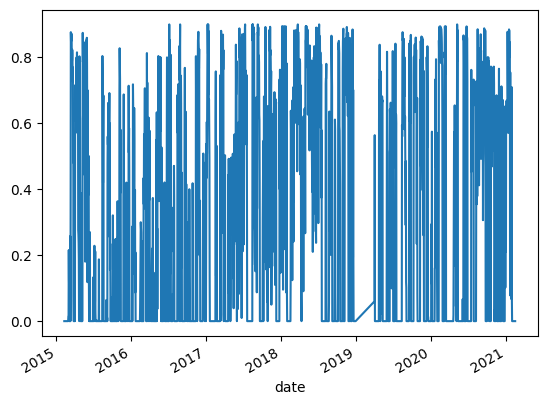

In [113]:
impact_mean.position_size.plot()

In [134]:
impact_majority.signal.value_counts()

signal
 0    1092
 1     545
-1     467
Name: count, dtype: int64

<Axes: xlabel='date'>

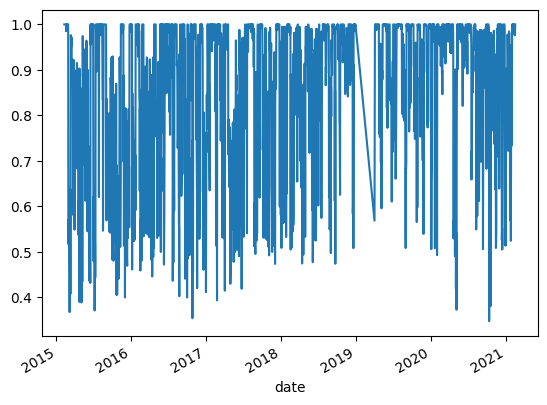

In [115]:
impact_majority.position_size.plot()

In [116]:
scaler = MinMaxScaler(feature_range=(0, 1))
position_sizes = impact_mean[['position_size']]  # Ensure it's a DataFrame
impact_mean['position_size'] = scaler.fit_transform(position_sizes)

In [117]:
scaler = MinMaxScaler(feature_range=(0, 1))
position_sizes = impact_majority[['position_size']]  # Ensure it's a DataFrame
impact_majority['position_size'] = scaler.fit_transform(position_sizes)

/tmp/ipykernel_18454/2140844817.py:3: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [147]:
merged_majority_df = labeled_df.merge(impact_majority[['signal', 'position_size']], left_index=True, right_index=True, how='left')
merged_majority_df['volatility'] = volatility
merged_majority_df.fillna(0, inplace=True)

In [149]:
merged_mean_df = labeled_df.merge(impact_mean[['signal', 'position_size']], left_index=True, right_index=True, how='left')
merged_mean_df['volatility'] = volatility
merged_mean_df.fillna(0, inplace=True)

## In-Out Signal Long Majority

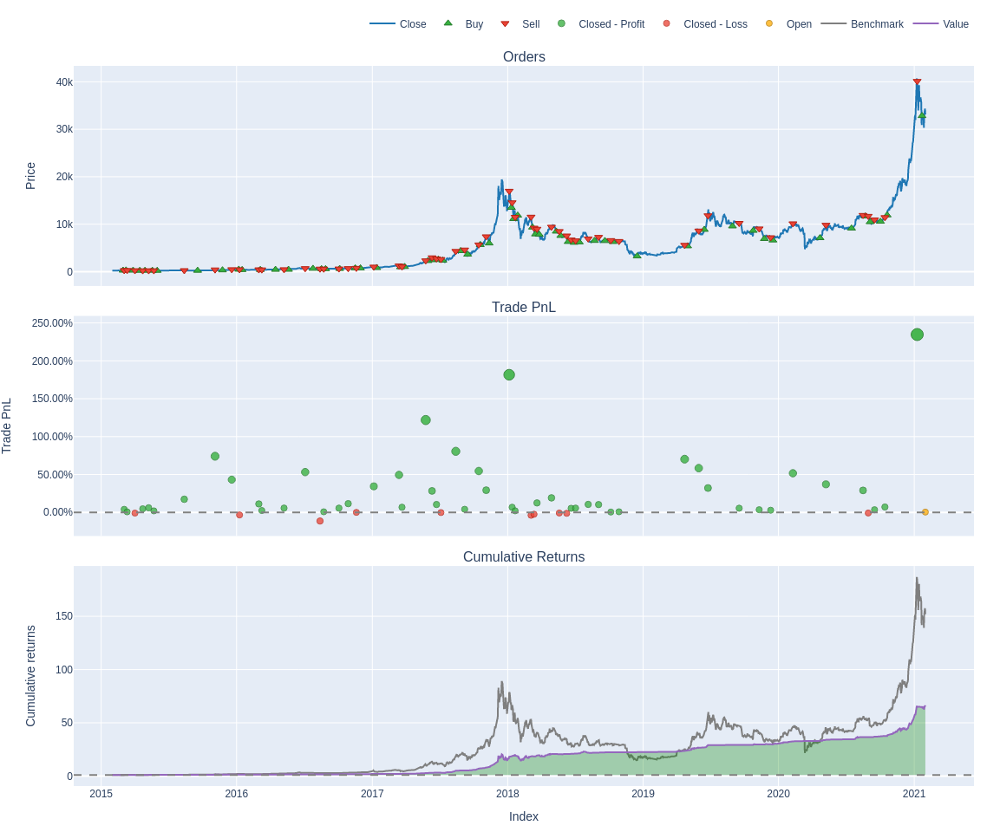

In [153]:
# Define the strategy
entries = merged_majority_df['signal'] > 0
exits = merged_majority_df['signal'] < 0
size = merged_majority_df['position_size']

pf = vbt.Portfolio.from_signals(
    close=merged_majority_df['close'],
    entries=entries,
    exits=exits,
    size=size,
    tp_stop=merged_majority_df['close'] * (1 + merged_majority_df['volatility']),
    sl_stop=merged_majority_df['close'] * (1 - merged_majority_df['volatility']),
    init_cash=1000,  # Initial cash value
    fees=0.005,  # Commission fees (0.5%)
    freq="D"
)

# Run the backtest
pf.plot().show()

In [155]:
pf.stats()

Start                         2015-01-31 00:00:00
End                           2021-01-31 00:00:00
Period                         2204 days 00:00:00
Start Value                                1000.0
End Value                            65202.312222
Total Return [%]                      6420.231222
Benchmark Return [%]                 15114.021796
Max Gross Exposure [%]                  86.989148
Total Fees Paid                       2669.288032
Max Drawdown [%]                         30.65978
Max Drawdown Duration           253 days 00:00:00
Total Trades                                   59
Total Closed Trades                            58
Total Open Trades                               1
Open Trade PnL                         129.649435
Win Rate [%]                            82.758621
Best Trade [%]                         234.743861
Worst Trade [%]                        -11.407978
Avg Winning Trade [%]                   30.265615
Avg Losing Trade [%]                    -2.526151


## In-Out Signal Long Mean

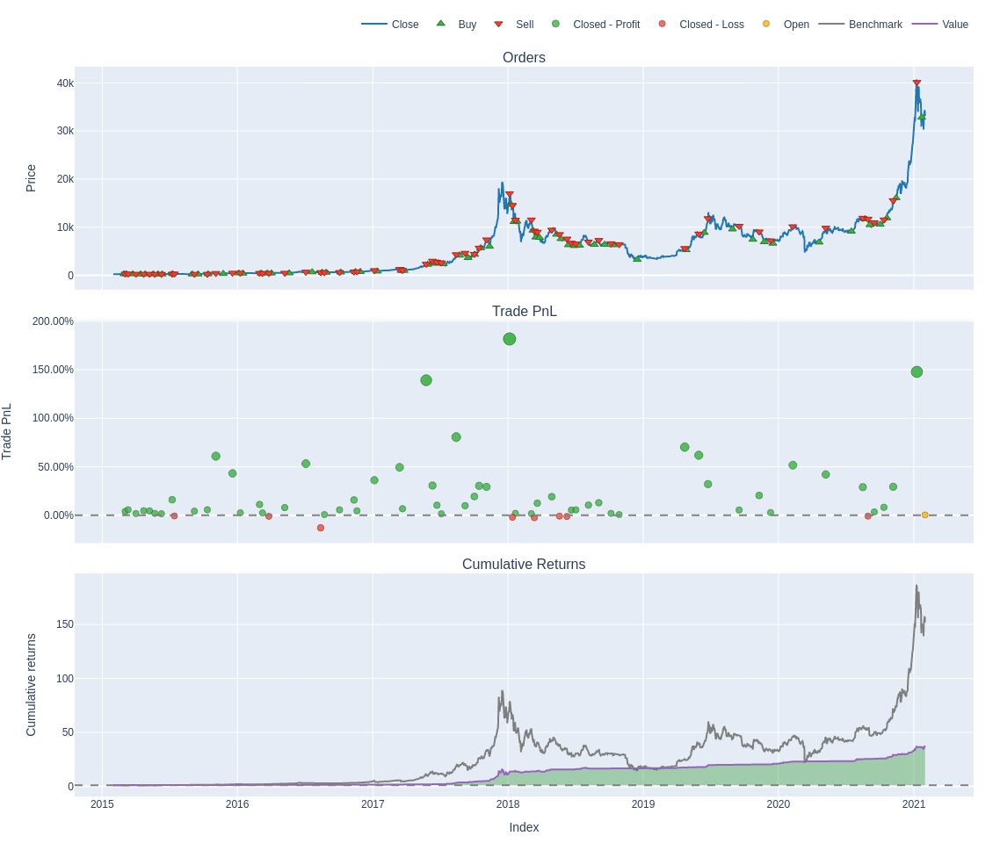

In [167]:
# Define the strategy
entries = merged_mean_df['signal'] > 0
exits = merged_mean_df['signal'] < 0
size = merged_mean_df['position_size']

pf = vbt.Portfolio.from_signals(
    close=merged_mean_df['close'],
    entries=entries,
    exits=exits,
    size=size,
    tp_stop=merged_mean_df['close'] * (1 + merged_mean_df['volatility']),
    sl_stop=merged_mean_df['close'] * (1 - merged_mean_df['volatility']),
    init_cash=1000,  # Initial cash value
    fees=0.005,  # Commission fees (0.5%)
    freq="D"
)

# Run the backtest
pf.plot().show()

In [168]:
pf.stats()

Start                                2015-01-31 00:00:00
End                                  2021-01-31 00:00:00
Period                                2204 days 00:00:00
Start Value                                       1000.0
End Value                                   36583.970153
Total Return [%]                             3558.397015
Benchmark Return [%]                        15114.021796
Max Gross Exposure [%]                         96.969076
Total Fees Paid                              1833.812404
Max Drawdown [%]                               33.417594
Max Drawdown Duration                  259 days 00:00:00
Total Trades                                          66
Total Closed Trades                                   65
Total Open Trades                                      1
Open Trade PnL                                113.871991
Win Rate [%]                                   87.692308
Best Trade [%]                                181.642129
Worst Trade [%]                

## In-Out-Signal-Short Majority

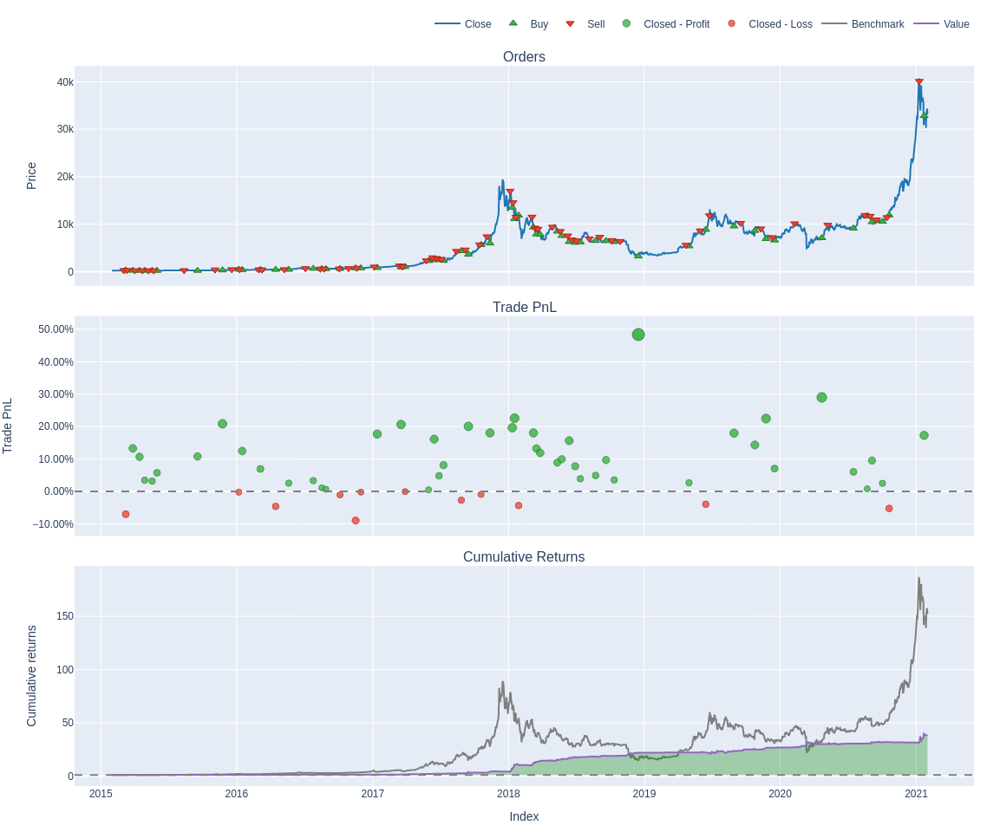

In [170]:
short_entries = merged_majority_df['signal'] < 0
short_exits = merged_majority_df['signal'] > 0
size = merged_majority_df['position_size']

# Run the backtest
pf = vbt.Portfolio.from_signals(
    close=merged_majority_df['close'],
    short_entries=short_entries,
    short_exits=short_exits,
    size=size,
    init_cash=1000,  # Initial cash value
    fees=0.005,  # Commission fees (0.5%)
    freq="D"
)

# Plot the results
pf.plot().show()

In [171]:
pf.stats()

Start                                2015-01-31 00:00:00
End                                  2021-01-31 00:00:00
Period                                2204 days 00:00:00
Start Value                                       1000.0
End Value                                   38368.851283
Total Return [%]                             3736.885128
Benchmark Return [%]                        15114.021796
Max Gross Exposure [%]                       1759.822811
Total Fees Paid                              2944.134166
Max Drawdown [%]                               18.155202
Max Drawdown Duration                  304 days 00:00:00
Total Trades                                          58
Total Closed Trades                                   58
Total Open Trades                                      0
Open Trade PnL                                       0.0
Win Rate [%]                                   79.310345
Best Trade [%]                                 48.372582
Worst Trade [%]                

## In-Out-Signal-Short Mean

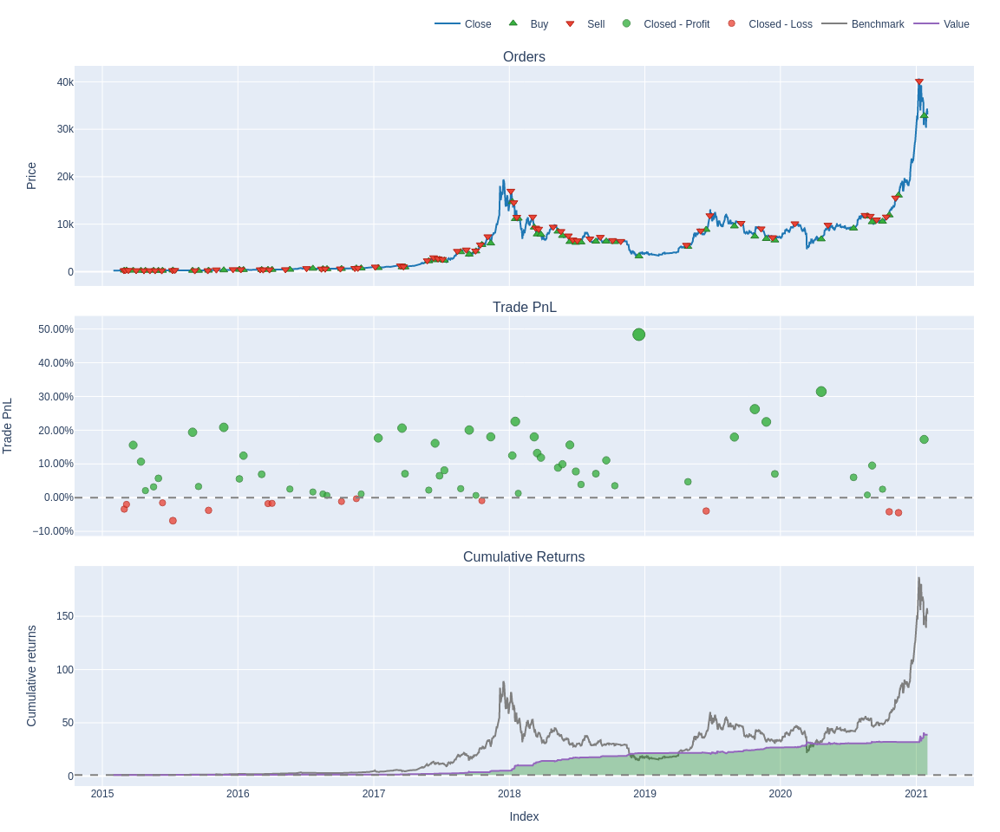

In [172]:
short_entries = merged_mean_df['signal'] < 0
short_exits = merged_mean_df['signal'] > 0
size = merged_mean_df['position_size']

# Run the backtest
pf = vbt.Portfolio.from_signals(
    close=merged_mean_df['close'],
    short_entries=short_entries,
    short_exits=short_exits,
    size=size,
    init_cash=1000,  # Initial cash value
    fees=0.005,  # Commission fees (0.5%)
    freq="D"
)

# Plot the results
pf.plot().show()

In [173]:
pf.stats()

Start                                2015-01-31 00:00:00
End                                  2021-01-31 00:00:00
Period                                2204 days 00:00:00
Start Value                                       1000.0
End Value                                   38799.818987
Total Return [%]                             3779.981899
Benchmark Return [%]                        15114.021796
Max Gross Exposure [%]                      18188.240621
Total Fees Paid                               2802.33349
Max Drawdown [%]                               16.353297
Max Drawdown Duration                  193 days 00:00:00
Total Trades                                          66
Total Closed Trades                                   66
Total Open Trades                                      0
Open Trade PnL                                       0.0
Win Rate [%]                                    80.30303
Best Trade [%]                                 48.372582
Worst Trade [%]                

## Buy-And-Hold

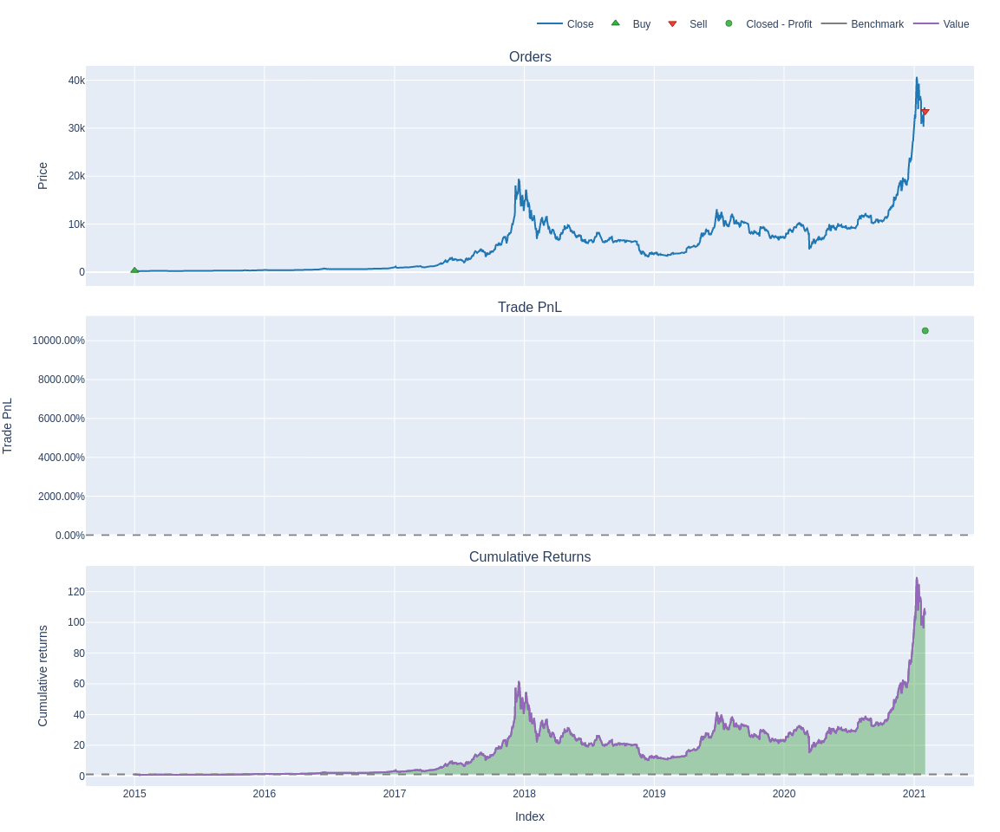

In [163]:
# Define the strategy
entries = pd.Series([True] + [False] * (len(price_df) - 1), index=price_df.index)
exits = pd.Series([False] * (len(price_df) - 1) + [True], index=price_df.index)

# Run the backtest
pf = vbt.Portfolio.from_signals(
    close=price_df['close'],
    entries=entries,
    exits=exits,
    init_cash=1000,  # Initial cash
    fees=0.005, # Commission fees
    freq="D"
)

# Plot the results
pf.plot().show()

In [164]:
pf.stats()

Start                         2015-01-01 00:00:00
End                           2021-02-01 00:00:00
Period                         2224 days 00:00:00
Start Value                                1000.0
End Value                           105622.959861
Total Return [%]                     10462.295986
Benchmark Return [%]                 10568.449715
Max Gross Exposure [%]                      100.0
Total Fees Paid                        535.743767
Max Drawdown [%]                        83.339569
Max Drawdown Duration          1079 days 00:00:00
Total Trades                                    1
Total Closed Trades                             1
Total Open Trades                               0
Open Trade PnL                                0.0
Win Rate [%]                                100.0
Best Trade [%]                       10514.607466
Worst Trade [%]                      10514.607466
Avg Winning Trade [%]                10514.607466
Avg Losing Trade [%]                          NaN


## TBL Majority

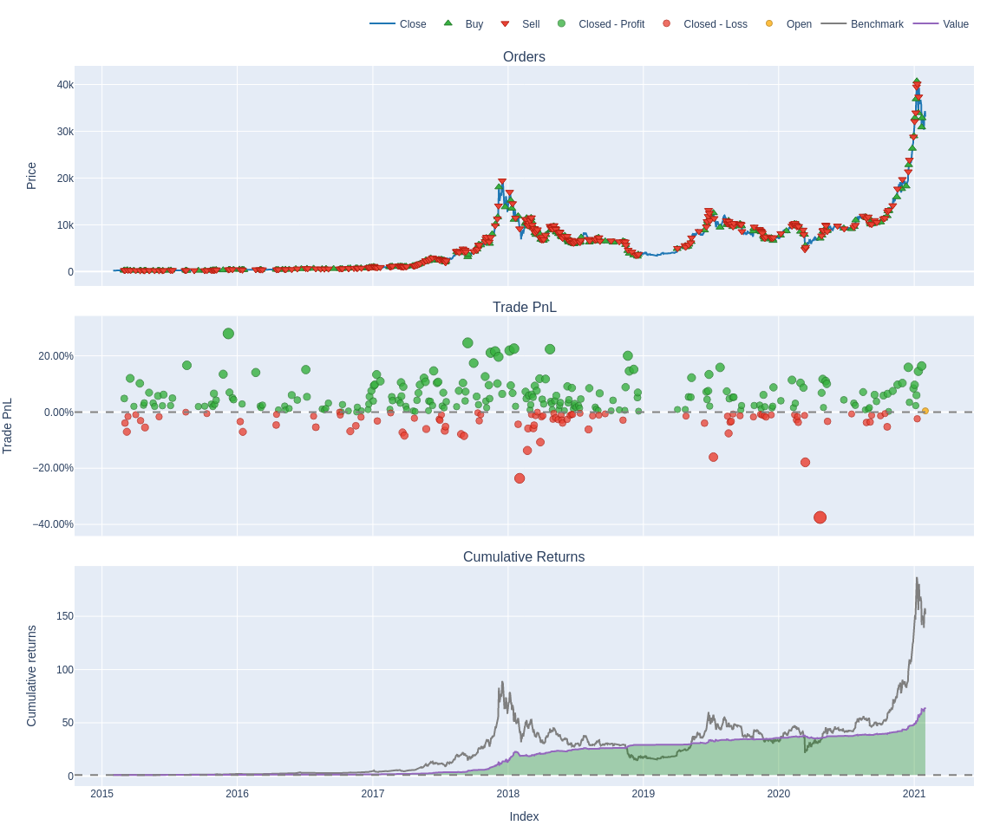

In [176]:
# Calculate the percentage changes for TP and SL
merged_majority_df['tp_stop'] = (merged_majority_df['upper_barrier'] - merged_majority_df['close']) / merged_majority_df['close']
merged_majority_df['sl_stop'] = (merged_majority_df['close'] - merged_majority_df['lower_barrier']) / merged_majority_df['close']
# Replace negative values with 0
merged_majority_df['tp_stop'] = merged_majority_df['tp_stop'].apply(lambda x: max(x, 0))
merged_majority_df['sl_stop'] = merged_majority_df['sl_stop'].apply(lambda x: max(x, 0))

# Define the strategy
entries = merged_majority_df['signal'] > 0
short_entries = merged_majority_df['signal'] < 0
size = merged_majority_df['position_size']

# Run the backtest
pf = vbt.Portfolio.from_signals(
    close=merged_majority_df['close'],
    entries=entries,
    short_entries=short_entries,
    # exits=exits,
    size=size,
    tp_stop=merged_majority_df['tp_stop'],
    sl_stop=merged_majority_df['sl_stop'],
    init_cash=1000,  # Initial cash value
    fees=0.005,  # Commission fees (0.5%)
    freq="D"
)

# Plot the results
pf.plot().show()

In [177]:
pf.stats()

Start                               2015-01-31 00:00:00
End                                 2021-01-31 00:00:00
Period                               2204 days 00:00:00
Start Value                                      1000.0
End Value                                  62981.386399
Total Return [%]                             6198.13864
Benchmark Return [%]                       15114.021796
Max Gross Exposure [%]                       864.877142
Total Fees Paid                            16963.799102
Max Drawdown [%]                              21.337939
Max Drawdown Duration                 139 days 00:00:00
Total Trades                                        317
Total Closed Trades                                 316
Total Open Trades                                     1
Open Trade PnL                               129.649435
Win Rate [%]                                  69.620253
Best Trade [%]                                27.934624
Worst Trade [%]                              -37

## TBL Mean

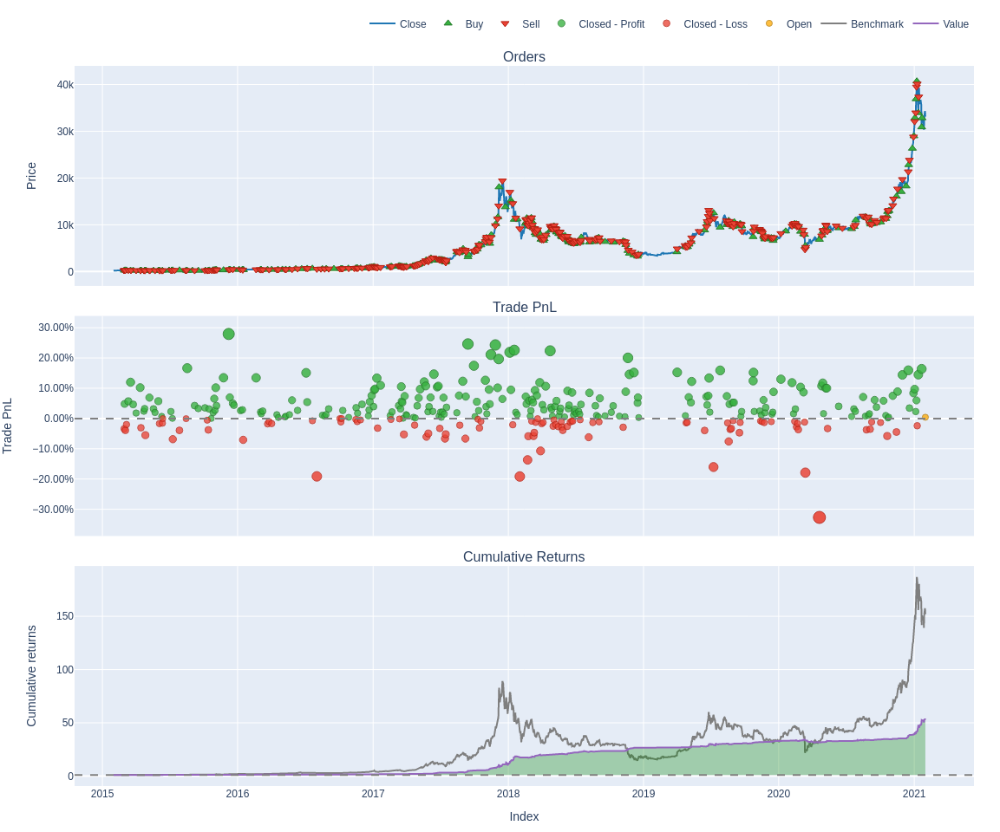

In [180]:
# Calculate the percentage changes for TP and SL
merged_mean_df['tp_stop'] = (merged_mean_df['upper_barrier'] - merged_mean_df['close']) / merged_mean_df['close']
merged_mean_df['sl_stop'] = (merged_mean_df['close'] - merged_mean_df['lower_barrier']) / merged_mean_df['close']
# Replace negative values with 0
merged_mean_df['tp_stop'] = merged_mean_df['tp_stop'].apply(lambda x: max(x, 0))
merged_mean_df['sl_stop'] = merged_mean_df['sl_stop'].apply(lambda x: max(x, 0))

# Define the strategy
entries = merged_mean_df['signal'] > 0
short_entries = merged_mean_df['signal'] < 0
size = merged_mean_df['position_size']

# Run the backtest
pf = vbt.Portfolio.from_signals(
    close=merged_mean_df['close'],
    entries=entries,
    short_entries=short_entries,
    # exits=exits,
    size=size,
    tp_stop=merged_mean_df['tp_stop'],
    sl_stop=merged_mean_df['sl_stop'],
    init_cash=1000,  # Initial cash value
    fees=0.005,  # Commission fees (0.5%)
    freq="D"
)

# Plot the results
pf.plot().show()

In [181]:
pf.stats()

Start                               2015-01-31 00:00:00
End                                 2021-01-31 00:00:00
Period                               2204 days 00:00:00
Start Value                                      1000.0
End Value                                  52730.792725
Total Return [%]                            5173.079273
Benchmark Return [%]                       15114.021796
Max Gross Exposure [%]                     40706.433981
Total Fees Paid                             13788.67449
Max Drawdown [%]                              20.924389
Max Drawdown Duration                 197 days 00:00:00
Total Trades                                        334
Total Closed Trades                                 333
Total Open Trades                                     1
Open Trade PnL                               113.871991
Win Rate [%]                                  70.570571
Best Trade [%]                                27.934624
Worst Trade [%]                              -32

## Optimization

  0%|          | 0/2401 [00:00<?, ?it/s]

Best Parameters: {'volatility_period': 11, 'upper_barrier_factor': 1.4, 'lower_barrier_factor': 1.3, 'vertical_barrier': 13, 'barrier_type': 'volatility', 'touch_type': 'HL'}
Best Sharpe Ratio: 2.4003444759115564


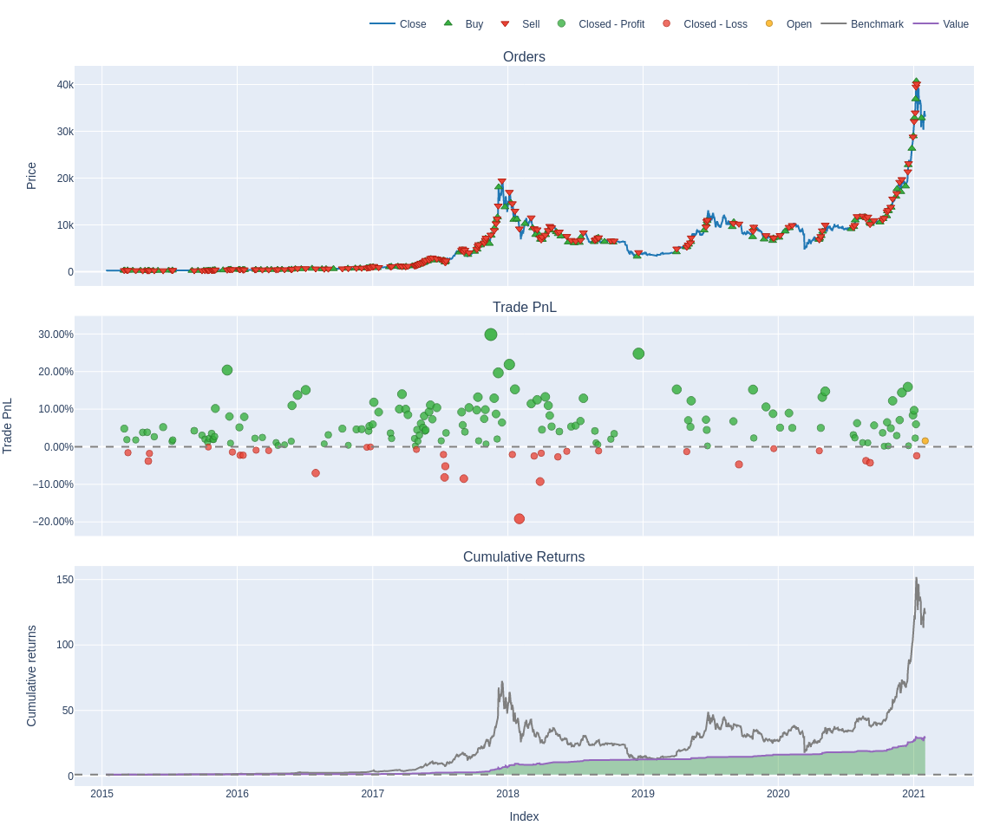

In [89]:
import pandas as pd
import vectorbt as vbt
from itertools import product
from tqdm.auto import tqdm

# Define the parameter grid
param_grid = {
    'volatility_period': [10, 11, 12, 13, 14, 15, 16],
    'upper_barrier_factor': [1.0, 1.1, 1.2, 1.3, 1.4, 1.5, 1.6],
    'lower_barrier_factor': [1.0, 1.1, 1.2, 1.3, 1.4, 1.5, 1.6],
    'vertical_barrier': [10, 11, 12, 13, 14, 15, 16],
    'barrier_type': ['volatility'],
    'touch_type': ['HL']
}

# Function to evaluate the strategy
def evaluate_strategy(params):
    labeler = TripleBarrierLabeler(**params)
    labeler.fit(price_df)
    labeled_df = labeler.transform()
    
    # Calculate the percentage changes for TP and SL
    labeled_df['tp_stop'] = (labeled_df['upper_barrier'] - labeled_df['close']) / labeled_df['close']
    labeled_df['sl_stop'] = (labeled_df['close'] - labeled_df['lower_barrier']) / labeled_df['close']
    
    # Replace negative values with 0
    labeled_df['tp_stop'] = labeled_df['tp_stop'].apply(lambda x: max(x, 0))
    labeled_df['sl_stop'] = labeled_df['sl_stop'].apply(lambda x: max(x, 0))
    
    # Define the strategy
    entries = labeled_df['signal'] > 0
    exits = labeled_df['signal'] < 0
    size = labeled_df['position_size']
    
    # Run the backtest
    pf = vbt.Portfolio.from_signals(
        close=labeled_df['close'],
        entries=entries,
        exits=exits,
        size=size,
        tp_stop=labeled_df['tp_stop'],
        sl_stop=labeled_df['sl_stop'],
        init_cash=1000,  # Initial cash value
        fees=0.005  # Commission fees (0.5%)
    )
    
    # Return the Sharpe ratio as the evaluation metric
    return pf.sharpe_ratio()

# Optimize parameters
best_params = None
best_sharpe_ratio = -float('inf')

# Use tqdm to show progress
for params in tqdm(product(*param_grid.values()), total=len(list(product(*param_grid.values())))):
    params_dict = dict(zip(param_grid.keys(), params))
    sharpe_ratio = evaluate_strategy(params_dict)
    
    if sharpe_ratio > best_sharpe_ratio:
        best_sharpe_ratio = sharpe_ratio
        best_params = params_dict

print("Best Parameters:", best_params)
print("Best Sharpe Ratio:", best_sharpe_ratio)

Best Parameters: {'volatility_period': 11, 'upper_barrier_factor': 1.4, 'lower_barrier_factor': 1.3, 'vertical_barrier': 13, 'barrier_type': 'volatility', 'touch_type': 'HL'}

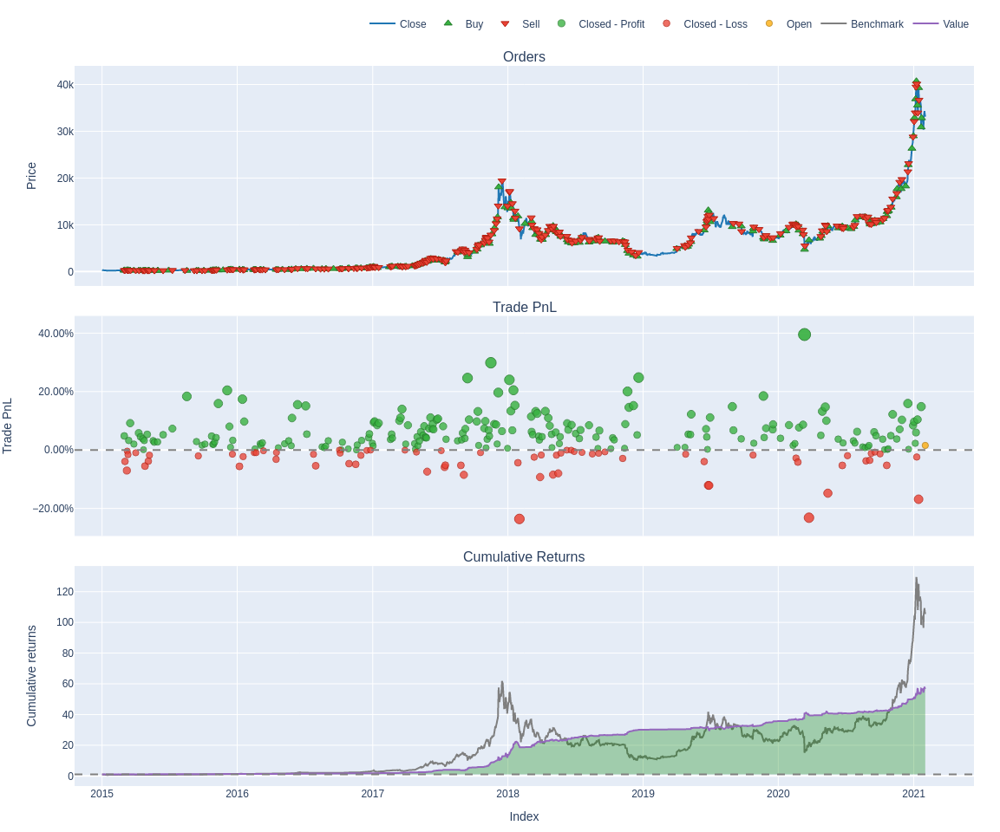

In [81]:
# Apply the optimized parameters to label the data
labeler = TripleBarrierLabeler(**best_params)
labeler.fit(price_df)
price_df = labeler.transform()

# Calculate the percentage changes for TP and SL
price_df['tp_stop'] = (price_df['upper_barrier'] - price_df['close']) / price_df['close']
price_df['sl_stop'] = (price_df['close'] - price_df['lower_barrier']) / price_df['close']
# Replace negative values with 0
price_df['tp_stop'] = price_df['tp_stop'].apply(lambda x: max(x, 0))
price_df['sl_stop'] = price_df['sl_stop'].apply(lambda x: max(x, 0))

# Define the strategy
entries = price_df['signal'] > 0
short_entries = price_df['signal'] < 0
size = price_df['position_size']

# Run the backtest
pf = vbt.Portfolio.from_signals(
    close=price_df['close'],
    entries=entries,
    short_entries=short_entries,
    # exits=exits,
    size=size,
    tp_stop=price_df['tp_stop'],
    sl_stop=price_df['sl_stop'],
    init_cash=1000,  # Initial cash value
    fees=0.005  # Commission fees (0.5%)
)

# Plot the results
pf.plot().show()

In [42]:
pf.stats()

Start                               2015-01-01 00:00:00
End                                 2021-02-01 00:00:00
Period                               2224 days 00:00:00
Start Value                                      1000.0
End Value                                  57041.569158
Total Return [%]                            5604.156916
Benchmark Return [%]                       10568.449715
Max Gross Exposure [%]                      1050.150731
Total Fees Paid                            12029.352453
Max Drawdown [%]                              19.664118
Max Drawdown Duration                 133 days 00:00:00
Total Trades                                        301
Total Closed Trades                                 300
Total Open Trades                                     1
Open Trade PnL                               430.195659
Win Rate [%]                                  75.666667
Best Trade [%]                                39.517543
Worst Trade [%]                              -23

  0%|          | 0/2401 [00:00<?, ?it/s]

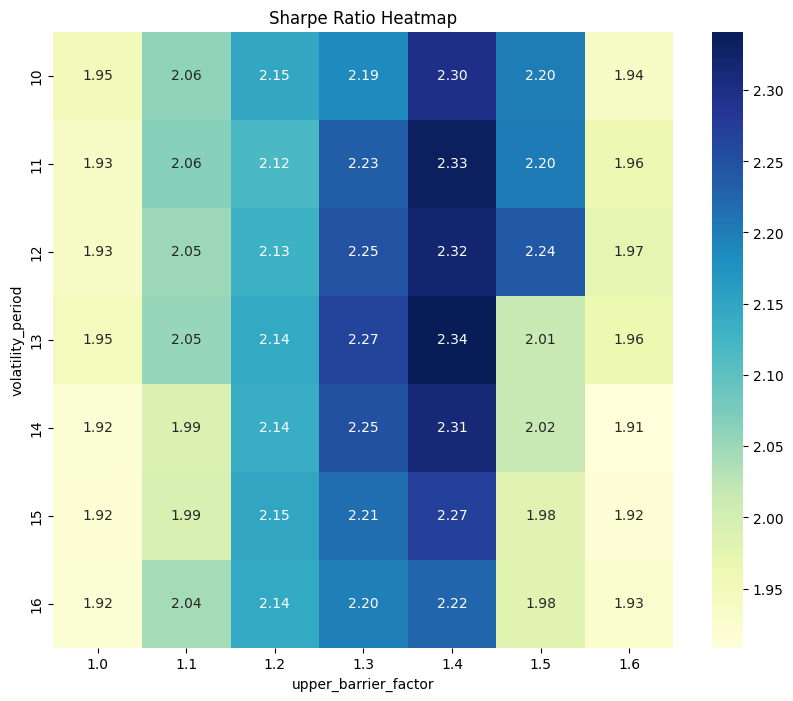

In [10]:
import pandas as pd
import vectorbt as vbt
from itertools import product
from tqdm.auto import tqdm
import seaborn as sns
import matplotlib.pyplot as plt

# Define the parameter grid
param_grid = {
    'volatility_period': [10, 11, 12, 13, 14, 15, 16],
    'upper_barrier_factor': [1.0, 1.1, 1.2, 1.3, 1.4, 1.5, 1.6],
    'lower_barrier_factor': [1.0, 1.1, 1.2, 1.3, 1.4, 1.5, 1.6],
    'vertical_barrier': [10, 11, 12, 13, 14, 15, 16],
    'barrier_type': ['volatility'],
    'touch_type': ['HL']
}

# Function to evaluate the strategy
def evaluate_strategy(params):
    labeler = TripleBarrierLabeler(**params)
    labeler.fit(price_df)
    labeled_df = labeler.transform()
    
    # Calculate the percentage changes for TP and SL
    labeled_df['tp_stop'] = (labeled_df['upper_barrier'] - labeled_df['close']) / labeled_df['close']
    labeled_df['sl_stop'] = (labeled_df['close'] - labeled_df['lower_barrier']) / labeled_df['close']
    
    # Replace negative values with 0
    labeled_df['tp_stop'] = labeled_df['tp_stop'].apply(lambda x: max(x, 0))
    labeled_df['sl_stop'] = labeled_df['sl_stop'].apply(lambda x: max(x, 0))
    
    # Define the strategy
    entries = labeled_df['signal'] > 0
    exits = labeled_df['signal'] < 0
    size = labeled_df['position_size']
    
    # Run the backtest
    pf = vbt.Portfolio.from_signals(
        close=labeled_df['close'],
        entries=entries,
        exits=exits,
        size=size,
        tp_stop=labeled_df['tp_stop'],
        sl_stop=labeled_df['sl_stop'],
        init_cash=1000,  # Initial cash value
        fees=0.005  # Commission fees (0.5%)
    )
    
    # Return the Sharpe ratio as the evaluation metric
    return pf.sharpe_ratio()

# Optimize parameters
results = []

# Use tqdm to show progress
for params in tqdm(product(*param_grid.values()), total=len(list(product(*param_grid.values())))):
    params_dict = dict(zip(param_grid.keys(), params))
    sharpe_ratio = evaluate_strategy(params_dict)
    results.append((params_dict, sharpe_ratio))

# Convert results to DataFrame
results_df = pd.DataFrame(results, columns=['params', 'sharpe_ratio'])

# Extract individual parameters for the heatmap
results_df['volatility_period'] = results_df['params'].apply(lambda x: x['volatility_period'])
results_df['upper_barrier_factor'] = results_df['params'].apply(lambda x: x['upper_barrier_factor'])
results_df['lower_barrier_factor'] = results_df['params'].apply(lambda x: x['lower_barrier_factor'])
results_df['vertical_barrier'] = results_df['params'].apply(lambda x: x['vertical_barrier'])

# Pivot the DataFrame for the heatmap
heatmap_data = results_df.pivot_table(index='volatility_period', columns='upper_barrier_factor', values='sharpe_ratio')

# Plot the heatmap
plt.figure(figsize=(10, 8))
sns.heatmap(heatmap_data, annot=True, fmt=".2f", cmap="YlGnBu")
plt.title('Sharpe Ratio Heatmap')
plt.show()
